In [9]:
#1

#to get ecdf data, run this entire notebook (1-8), you will end up with 24 CSV's 
#necessary files: data/ssprcp_126, data/ssprcp_245, data/ssprcp585

#import necessary packages
using PlotlyJS
using CSV
using DataFrames
#using StatsPlots


┌ Warning: Kaleido is not available on this system. Julia will be unable to save images of any plots.
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:65


┌ Warning: ErrorException("Could not start Kaleido process")
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:66


In [11]:
#2
npv_126 = Matrix(CSV.read("data/ssprcp_126/NPVOptimal_Gulf_126.csv", DataFrame))
npv_245 = Matrix(CSV.read("data/ssprcp_245/NPVOptimal_Gulf_245.csv", DataFrame))
npv_585 = Matrix(CSV.read("data/ssprcp_585/NPVOptimal_Gulf_585.csv", DataFrame))


178×20000 Matrix{Float64}:
 0.0380279   0.0299595   0.0355074   …  0.0259352   0.021014    0.0342702
 0.0911258   0.0710872   0.083213       0.0560988   0.0451279   0.0800405
 0.0457498   0.0372418   0.0424135      0.0308853   0.026234    0.0410654
 0.036289    0.029637    0.0336498      0.024638    0.0210211   0.032598
 0.216754    0.171911    0.19912        0.138393    0.113948    0.192021
 0.164053    0.115874    0.145833    …  0.0957569   0.0710088   0.139404
 0.0100737   0.00838402  0.00944189     0.00720181  0.00626738  0.00917682
 0.145031    0.114418    0.134886       0.0960148   0.0781517   0.129983
 0.194982    0.157115    0.180947       0.129105    0.106127    0.174666
 0.110853    0.102622    0.106657       0.0958364   0.0918448   0.105445
 ⋮                                   ⋱                          
 0.00849161  0.0071784   0.00794882     0.00615228  0.0054524   0.00774685
 0.0168059   0.014174    0.0156986   …  0.0125688   0.0111278   0.0153242
 0.0339641   0.0288969  

In [12]:
#3
#reading data
#make sure that you have the data folder to read from

#reading optial costs
oc_2050_126 = Matrix(CSV.read("data/ssprcp_126/OptimalCost_Gulf_2050_126.csv", DataFrame))
oc_2050_245 = Matrix(CSV.read("data/ssprcp_245/OptimalCost_Gulf_2050_245.csv", DataFrame))
oc_2050_585 = Matrix(CSV.read("data/ssprcp_585/OptimalCost_Gulf_2050_585.csv", DataFrame))

oc_2100_126 = Matrix(CSV.read("data/ssprcp_126/OptimalCost_Gulf_2100_126.csv", DataFrame))
oc_2100_245 = Matrix(CSV.read("data/ssprcp_245/OptimalCost_Gulf_2100_245.csv", DataFrame))
oc_2100_585 = Matrix(CSV.read("data/ssprcp_585/OptimalCost_Gulf_2100_585.csv", DataFrame))

#reading no adapt costs
na_2050_126 = Matrix(CSV.read("data/ssprcp_126/NoAdaptCost_Gulf_2050_126.csv", DataFrame))
na_2050_245 = Matrix(CSV.read("data/ssprcp_245/NoAdaptCost_Gulf_2050_245.csv", DataFrame))
na_2050_585 = Matrix(CSV.read("data/ssprcp_585/NoAdaptCost_Gulf_2050_585.csv", DataFrame))

na_2100_126 = Matrix(CSV.read("data/ssprcp_126/NoAdaptCost_Gulf_2100_126.csv", DataFrame))
na_2100_245 = Matrix(CSV.read("data/ssprcp_245/NoAdaptCost_Gulf_2100_245.csv", DataFrame))
na_2100_585 = Matrix(CSV.read("data/ssprcp_585/NoAdaptCost_Gulf_2100_585.csv", DataFrame))

178×20000 Matrix{Float64}:
 0.105796   0.0838382  0.100229   …  0.0765601  0.0402717   0.0970112
 0.533001   0.457325   0.513872      0.432832   0.321618    0.502813
 0.152399   0.118029   0.143714      0.106932   0.0733107   0.138693
 0.216175   0.191198   0.209861      0.183111   0.151978    0.206211
 0.791432   0.61083    0.745792      0.552504   0.318183    0.719407
 0.740208   0.574738   0.69835    …  0.52082    0.191144    0.674153
 0.0196541  0.0151804  0.0185184     0.0136943  0.00939423  0.0178636
 0.698293   0.625511   0.680816      0.599679   0.350518    0.669963
 0.245927   0.18413    0.230135      0.162131   0.136706    0.221034
 0.445321   0.347647   0.420552      0.315409   0.29923     0.40627
 ⋮                                ⋱                         
 0.0298498  0.0263583  0.028956      0.0251672  0.0236534   0.0284501
 0.40492    0.394659   0.402298   …  0.391207   0.386801    0.400814
 0.0618524  0.0477918  0.0582326     0.0429753  0.0401104   0.0562221
 0.0901283  

In [13]:
#4

#=
bymodels function takes the csv cost data and organizes it by model, where 
rows are models and columns are trials/segments
=#
function bymodels(data)
    model_data = []  

        for i in range(1,20)
            m = []
            for k in range(1,178)   
                push!(m, data[k, i])
                for j in range(2,1000)
                    push!(m, data[k, 20(j-1) + i])
                end
            end
            if i == 1
                model_data = m
            else
                model_data = hcat(model_data, m)
            end
            
        end

    return model_data
end

bymodels (generic function with 1 method)

In [14]:
#5
#Optimal Cost By Model
models_126_2050_oc = Matrix(transpose(bymodels(oc_2050_126)))
models_245_2050_oc = Matrix(transpose(bymodels(oc_2050_245)))
models_585_2050_oc = Matrix(transpose(bymodels(oc_2050_585)))

models_126_2100_oc = Matrix(transpose(bymodels(oc_2100_126)))
models_245_2100_oc = Matrix(transpose(bymodels(oc_2100_245)))
models_585_2100_oc = Matrix(transpose(bymodels(oc_2100_585)))


#No Adapt Cost By Model
models_126_2050_na = Matrix(transpose(bymodels(na_2050_126)))
models_245_2050_na = Matrix(transpose(bymodels(na_2050_245)))
models_585_2050_na = Matrix(transpose(bymodels(na_2050_585)))

models_126_2100_na = Matrix(transpose(bymodels(na_2100_126)))
models_245_2100_na = Matrix(transpose(bymodels(na_2100_245)))
models_585_2100_na = Matrix(transpose(bymodels(na_2100_585)))

20×178000 Matrix{Any}:
 0.105796   0.111044   0.0934407  …  0.0519516  0.0559002  0.0577183
 0.0838382  0.0901289  0.0726424     0.0469993  0.0471951  0.0472681
 0.100229   0.0955988  0.0733883     0.0500251  0.0489779  0.0532281
 0.0918694  0.0905625  0.0985737     0.0578096  0.0534403  0.0507166
 0.0886762  0.0921303  0.0867038     0.056664   0.0511612  0.0594835
 0.0994434  0.0871072  0.0879286  …  0.058449   0.0536814  0.0540711
 0.111902   0.120681   0.115889      0.0626196  0.064852   0.0519657
 0.0984194  0.110206   0.0844527     0.0603415  0.0484898  0.049013
 0.095994   0.0801036  0.0870783     0.0491762  0.0491873  0.0524874
 0.114626   0.119627   0.106396      0.0680522  0.0508182  0.0511515
 0.0694959  0.0822785  0.0794057  …  0.0455534  0.0500944  0.0525673
 0.050351   0.081313   0.0460693     0.046819   0.0503753  0.0400665
 0.100744   0.106042   0.0986985     0.0550342  0.0492417  0.0528591
 0.0977821  0.082608   0.0664445     0.0503227  0.0541788  0.051519
 0.0828871  0

In [15]:
#6
models_npv_126 = Matrix(transpose(bymodels(npv_126)))
models_npv_245 = Matrix(transpose(bymodels(npv_245)))
models_npv_585 = Matrix(transpose(bymodels(npv_585)))

20×178000 Matrix{Any}:
 0.0380279  0.039827   0.0335555  …  0.0642219  0.0647219  0.0655035
 0.0299595  0.0324226  0.0254546     0.0626583  0.0621702  0.0623995
 0.0355074  0.0326064  0.02493       0.0619539  0.0614082  0.0598009
 0.0298868  0.0288821  0.0335875     0.065091   0.0640348  0.0622893
 0.0298614  0.0305865  0.0297763     0.0643608  0.0630739  0.0652553
 0.0340072  0.027646   0.0294678  …  0.0646759  0.0565162  0.0635067
 0.0404274  0.0422036  0.0426187     0.0670215  0.0679356  0.0639936
 0.034527   0.0389821  0.0289394     0.0656816  0.0627618  0.0626095
 0.0335385  0.0261997  0.0303994     0.0635482  0.0634402  0.0636085
 0.0428281  0.0427234  0.0389793     0.0692733  0.0632196  0.0633135
 0.0246597  0.0288091  0.0281375  …  0.0619893  0.0607591  0.0593622
 0.0225829  0.0284326  0.0221257     0.061787   0.058312   0.0531015
 0.0341955  0.0357843  0.0346559     0.0652827  0.0642598  0.0645072
 0.035467   0.0277753  0.0242576     0.0623901  0.059858   0.0622775
 0.0290352 

In [16]:
#7
function sum_segments(data)
    final = []
    for i in range(1,1000)
        mysum = zeros(20,1)
        for j in range(1,178)
            d = 1000j - 1000 + i 
            mysum = mysum + data[:,d]
        end
        if i == 1
            final = mysum
        else
            final = hcat(final,mysum)
        end

    end
    return final
end
    


sum_segments (generic function with 1 method)

In [17]:
#8
oc_2050_126_sum = sum_segments(models_126_2050_oc)
oc_2050_245_sum = sum_segments(models_245_2050_oc)
oc_2050_585_sum = sum_segments(models_585_2050_oc)

oc_2100_126_sum = sum_segments(models_126_2100_oc)
oc_2100_245_sum = sum_segments(models_245_2100_oc)
oc_2100_585_sum = sum_segments(models_585_2100_oc)

#reading no adapt costs
na_2050_126_sum = sum_segments(models_126_2050_na)
na_2050_245_sum = sum_segments(models_245_2050_na)
na_2050_585_sum = sum_segments(models_585_2050_na)

na_2100_126_sum = sum_segments(models_126_2100_na)
na_2100_245_sum = sum_segments(models_245_2100_na)
na_2100_585_sum = sum_segments(models_585_2100_na)

20×1000 Matrix{Float64}:
 237.485  248.989  212.037  236.985  …  227.463  186.693  207.355  214.023
 188.238  205.257  154.32   223.665     214.318  167.247  148.968  169.793
 226.015  216.082  159.527  204.496     225.831  178.545  174.947  141.177
 203.912  198.609  221.79   201.543     231.855  212.093  192.942  163.647
 198.013  206.636  193.509  221.484     233.173  208.032  183.797  219.803
 223.858  188.874  194.741  235.386  …  209.497  215.878  127.791  197.831
 251.693  271.211  261.817  231.805     294.339  228.914  236.773  188.77
 222.168  246.587  186.572  226.187     220.773  222.412  172.465  175.855
 217.124  172.279  195.765  218.149     188.083  169.586  176.063  192.838
 260.027  269.393  239.198  234.965     274.569  247.404  182.598  184.766
 151.125  182.5    174.855  148.976  …  126.199  161.279  139.587  129.9
 135.256  179.445  131.132  177.276     189.224  167.782  121.178   70.3531
 226.444  237.038  222.463  217.394     242.993  200.202  174.806  192.123
 2

In [18]:
#9
npv_126_sum = sum_segments(models_npv_126)
npv_245_sum = sum_segments(models_npv_245)
npv_585_sum = sum_segments(models_npv_585)


20×1000 Matrix{Float64}:
 161.625  167.561  153.374   164.665  …  125.799   141.598   150.725
 138.758  149.318  116.995   162.532     118.432   108.229   122.919
 159.313  145.641  112.704   141.652     120.228   119.538    98.5792
 131.956  127.053  148.781   134.499     134.531   127.441   108.195
 134.694  136.534  134.783   156.225     135.36    124.445   152.9
 151.417  122.287  131.011   164.272  …  139.257    86.0732  132.93
 168.274  172.652  177.185   168.913     152.041   164.524   130.288
 156.62   163.759  131.514   155.547     152.177   118.335   122.794
 150.572  116.759  136.945   154.87      112.581   121.306   132.895
 181.143  178.441  167.444   174.652     162.06    125.817   128.457
 112.597  130.845  128.481   111.024  …  115.198   100.924    95.9082
 102.511  129.982   99.8873  133.278     120.931    90.4542   70.4507
 151.905  157.434  155.746   148.095     131.811   117.61    130.316
 161.685  125.443  109.213   136.394     106.542    95.5938  132.649
 131.658 

In [19]:
#10

#=
myone creates a vertex of 1's of given length
=#
function myone(length)
    one = zeros(length, 1)
    for i in range(1, length)
        one[i] = 1
    end
    return one
end

myone (generic function with 1 method)

In [20]:
#11

#=
myecdf function calculates the empirircal cdf of the data set 
=#
function myecdf(data)
    sorted = sort(data)
    n = length(data)
    xecdf = zeros(length(data)*2, 1)
    yecdf = zeros(length(data)*2, 1)

    k = 1
    xecdf[k] = sorted[1]
    xecdf[k+1] = sorted[1]
    yecdf[k] = 0
    yecdf[k+1] = 1/n
    k = k + 2

    for j in range(2,length(data))
        xecdf[k] = sorted[j]
        xecdf[k+1] = sorted[j]
        yecdf[k] = findlast(x->x==sorted[j-1], sorted)/n
        yecdf[k+1] = findlast(x->x==sorted[j], sorted)/n
        k = k + 2
    end
    
    return xecdf, yecdf
end

myecdf (generic function with 1 method)

In [21]:
#12
#=
Function to run ecdf function
=#
function ecdf_plot_data(data)
    x_ecdf, y_ecdf = myecdf(data[1,:])

    x_data = x_ecdf
    y_data = y_ecdf

    for i in range(2,20)
        x_ecdf, y_ecdf = myecdf(data[i,:])
        x_data = hcat(x_data, x_ecdf)
        y_data = hcat(y_data, y_ecdf)
    end

    return x_data, y_data
end

    

ecdf_plot_data (generic function with 1 method)

NPV

In [25]:
#13
ecdf_npv_126 = ecdf_plot_data(npv_126_sum)
CSV.write("x_ecdf_npv_126.csv", DataFrame(ecdf_npv_126[1], :auto))
CSV.write("y_ecdf_npv_126.csv", DataFrame(ecdf_npv_126[2], :auto))
x_ecdf_npv_126 = ecdf_npv_126[1]
y_ecdf_npv_126 = ecdf_npv_126[2]

p=PlotlyJS.plot(PlotlyJS.scatter(x=x_ecdf_npv_126[:,1], y=log_mult.(ones(2000,20) - y_ecdf_npv_126)[:,1],name=models[1],showlegend = true), Layout(title = "Survival Plot NPV Optimal ssprcp 126", length = 700, height = 500,xaxis_title = "NPV Optimal billion US\$2010/yr", yaxis_title = "Survival Probability" ))
for i in range(2,20)
    PlotlyJS.add_trace!(p,PlotlyJS.scatter(x=x_ecdf_npv_126[:,i], y=log_mult.(ones(2000,20) - y_ecdf_npv_126)[:,i],name=models[i]))
end
#savefig(p,"ecdf_npv_126.png")
p

┌ Warning: Kaleido is not available on this system. Julia will be unable to save images of any plots.
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:65
┌ Warning: ErrorException("Could not start Kaleido process")
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:66


data: [
  "scatter with fields name, showlegend, type, x, and y",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis"
]

layout: "layout with fields height, length, margin, template, title, xaxis, and yaxis"

┌ Warning: Kaleido is not available on this system. Julia will be unable to save images of any plots.
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:65
┌ Warning: ErrorException("Could not start Kaleido process")
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:66


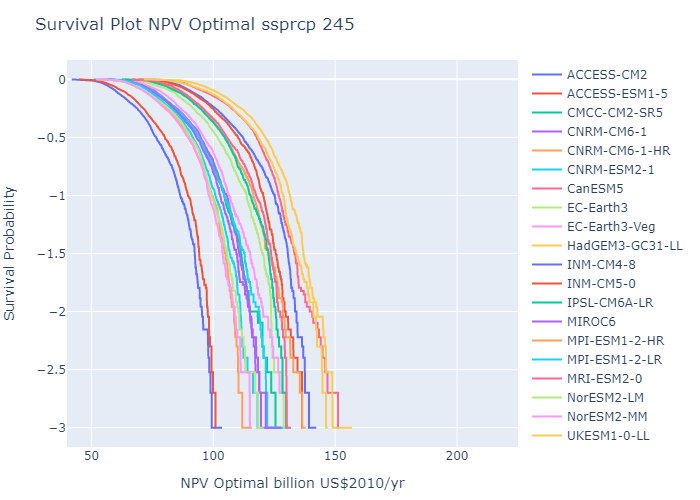

In [44]:
#14
ecdf_npv_245 = ecdf_plot_data(npv_245_sum)
CSV.write("x_ecdf_npv_245.csv", DataFrame(ecdf_npv_245[1], :auto))
CSV.write("y_ecdf_npv_245.csv", DataFrame(ecdf_npv_245[2], :auto))
x_ecdf_npv_245 = ecdf_npv_245[1]
y_ecdf_npv_245 = ecdf_npv_245[2]

p=PlotlyJS.plot(PlotlyJS.scatter(x=x_ecdf_npv_245[:,1], y=log_mult.(ones(2000,20) - y_ecdf_npv_245)[:,1],name=models[1],showlegend = true), Layout(title = "Survival Plot NPV Optimal ssprcp 245", length = 700, height = 500,  xaxis_range = [40,225],xaxis_title = "NPV Optimal billion US\$2010/yr", yaxis_title = "Survival Probability"))
for i in range(2,20)
    PlotlyJS.add_trace!(p,PlotlyJS.scatter(x=x_ecdf_npv_245[:,i], y=log_mult.(ones(2000,20) - y_ecdf_npv_245)[:,i],name=models[i]))
end
#savefig(p,"ecdf_npv_245.png")
p

In [30]:
#15
ecdf_npv_585 = ecdf_plot_data(npv_585_sum)
CSV.write("x_ecdf_npv_585.csv", DataFrame(ecdf_npv_585[1], :auto))
CSV.write("y_ecdf_npv_585.csv", DataFrame(ecdf_npv_585[2], :auto))
x_ecdf_npv_585 = ecdf_npv_585[1]
y_ecdf_npv_585 = ecdf_npv_585[2]

p=PlotlyJS.plot(PlotlyJS.scatter(x=x_ecdf_npv_585[:,1], y=log_mult.(ones(2000,20) - y_ecdf_npv_585)[:,1],name=models[1],showlegend = true), Layout(title = "Survival Plot NPV Optimal ssprcp 585", length = 700, height = 500,  xaxis_range = [40,225],xaxis_title = "NPV Optimal billion US\$2010/yr", yaxis_title = "Survival Probability"))
for i in range(2,20)
    PlotlyJS.add_trace!(p,PlotlyJS.scatter(x=x_ecdf_npv_585[:,i], y=log_mult.(ones(2000,20) - y_ecdf_npv_585)[:,i],name=models[i]))
end
#savefig(p,"ecdf_npv_585.png")
p

UndefVarError: UndefVarError: `models` not defined

Optimal Cost

In [ ]:
#16
#NON NECESSE EST
#2050
#=
ecdf_oc_126_2050 = ecdf_plot_data(models_126_2050_oc)
CSV.write("x_ecdf_126_2050_oc.csv", DataFrame(ecdf_oc_126_2050[1], :auto))
CSV.write("y_ecdf_126_2050_oc.csv", DataFrame(ecdf_oc_126_2050[2], :auto))

ecdf_oc_245_2050 = ecdf_plot_data(models_245_2050_oc)
CSV.write("x_ecdf_245_2050_oc.csv", DataFrame(ecdf_oc_245_2050[1], :auto))
CSV.write("y_ecdf_245_2050_oc.csv", DataFrame(ecdf_oc_245_2050[2], :auto))

ecdf_oc_585_2050 = ecdf_plot_data(models_585_2050_oc)
CSV.write("x_ecdf_585_2050_oc.csv", DataFrame(ecdf_oc_585_2050[1], :auto))
CSV.write("y_ecdf_585_2050_oc.csv", DataFrame(ecdf_oc_585_2050[2], :auto))

#2100
ecdf_oc_126_2100 = ecdf_plot_data(models_126_2100_oc)
CSV.write("x_ecdf_126_2100_oc.csv", DataFrame(ecdf_oc_126_2100[1], :auto))
CSV.write("y_ecdf_126_2100_oc.csv", DataFrame(ecdf_oc_126_2100[2], :auto))

ecdf_oc_245_2100 = ecdf_plot_data(models_245_2100_oc)
CSV.write("x_ecdf_245_2100_oc.csv", DataFrame(ecdf_oc_245_2100[1], :auto))
CSV.write("y_ecdf_245_2100_oc.csv", DataFrame(ecdf_oc_245_2100[2], :auto))

ecdf_oc_585_2100 = ecdf_plot_data(models_585_2100_oc)
CSV.write("x_ecdf_585_2100_oc.csv", DataFrame(ecdf_oc_585_2100[1], :auto))
CSV.write("y_ecdf_585_2100_oc.csv", DataFrame(ecdf_oc_585_2100[2], :auto))

#na
#2050
ecdf_na_126_2050 = ecdf_plot_data(models_126_2050_na)
CSV.write("x_ecdf_126_2050_na.csv", DataFrame(ecdf_na_126_2050[1], :auto))
CSV.write("y_ecdf_126_2050_na.csv", DataFrame(ecdf_na_126_2050[2], :auto))

ecdf_na_245_2050 = ecdf_plot_data(models_245_2050_na)
CSV.write("x_ecdf_245_2050_na.csv", DataFrame(ecdf_na_245_2050[1], :auto))
CSV.write("y_ecdf_245_2050_na.csv", DataFrame(ecdf_na_245_2050[2], :auto))

ecdf_na_585_2050 = ecdf_plot_data(models_585_2050_na)
CSV.write("x_ecdf_585_2050_na.csv", DataFrame(ecdf_na_585_2050[1], :auto))
CSV.write("y_ecdf_585_2050_na.csv", DataFrame(ecdf_na_585_2050[2], :auto))

#2100
ecdf_na_126_2100 = ecdf_plot_data(models_126_2100_na)
CSV.write("x_ecdf_126_2100_na.csv", DataFrame(ecdf_na_126_2100[1], :auto))
CSV.write("y_ecdf_126_2100_na.csv", DataFrame(ecdf_na_126_2100[2], :auto))

ecdf_na_245_2100 = ecdf_plot_data(models_245_2100_na)
CSV.write("x_ecdf_245_2100_na.csv", DataFrame(ecdf_na_245_2100[1], :auto))
CSV.write("y_ecdf_245_2100_na.csv", DataFrame(ecdf_na_245_2100[2], :auto))

ecdf_na_585_2100 = ecdf_plot_data(models_585_2100_na)
CSV.write("x_ecdf_585_2100_na.csv", DataFrame(ecdf_na_585_2100[1], :auto))
CSV.write("y_ecdf_585_2100_na.csv", DataFrame(ecdf_na_585_2100[2], :auto))

=#


Plotting

In [23]:
#17
models = ["ACCESS-CM2" "ACCESS-ESM1-5" "CMCC-CM2-SR5" "CNRM-CM6-1" "CNRM-CM6-1-HR" "CNRM-ESM2-1" "CanESM5" "EC-Earth3" "EC-Earth3-Veg" "HadGEM3-GC31-LL" "INM-CM4-8" "INM-CM5-0" "IPSL-CM6A-LR" "MIROC6" "MPI-ESM1-2-HR" "MPI-ESM1-2-LR" "MRI-ESM2-0" "NorESM2-LM" "NorESM2-MM" "UKESM1-0-LL"]


1×20 Matrix{String}:
 "ACCESS-CM2"  "ACCESS-ESM1-5"  …  "NorESM2-MM"  "UKESM1-0-LL"

In [24]:
#18
function log_mult(entry)
    return log10(entry)
end


log_mult (generic function with 1 method)

In [27]:
#19
function myone(length)
    one = zeros(length, 20)
    for i in range(1, length)
        for j in range(1,20)
            one[i,j] = 1
        end
    end
    return one
end

myone (generic function with 1 method)

In [37]:
#20
function create_survival(data, costtype, year, ssprcp)
    datax, datay = ecdf_plot_data(data)
    models = ["ACCESS-CM2" "ACCESS-ESM1-5" "CMCC-CM2-SR5" "CNRM-CM6-1" "CNRM-CM6-1-HR" "CNRM-ESM2-1" "CanESM5" "EC-Earth3" "EC-Earth3-Veg" "HadGEM3-GC31-LL" "INM-CM4-8" "INM-CM5-0" "IPSL-CM6A-LR" "MIROC6" "MPI-ESM1-2-HR" "MPI-ESM1-2-LR" "MRI-ESM2-0" "NorESM2-LM" "NorESM2-MM" "UKESM1-0-LL"]

    p=PlotlyJS.plot(PlotlyJS.scatter(x=datax[:,1], y=log_mult.(ones(2000,20) - datay)[:,1],name=models[1],showlegend = true), Layout(title =  string("Survival Plot ", costtype, " SSP/RCP ", ssprcp, " Year ", year), length = 700, height = 500, xaxis_title = string(costtype, " billion US\$2010/yr"), yaxis_title = "Survival Probability"))
    for i in range(2,20)
        PlotlyJS.add_trace!(p,PlotlyJS.scatter(x=datax[:,i], y=log_mult.(ones(2000,20) - datay)[:,i],name=models[i]))
    end
    filename = string("survival_plots/ecdf_", costtype, "_", ssprcp, "_", year, ".png")
    #savefig(p,filename)
    return p, filename
end
    
    

create_survival (generic function with 1 method)

In [30]:
#21
create_survival(npv_126_sum, "NPV", 2050, 126)

┌ Warning: Kaleido is not available on this system. Julia will be unable to save images of any plots.
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:65
┌ Warning: ErrorException("Could not start Kaleido process")
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:66
┌ Warning: Kaleido is not available on this system. Julia will be unable to save images of any plots.
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:65
┌ Warning: ErrorException("Could not start Kaleido process")
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:66


data: [
  "scatter with fields name, showlegend, type, x, and y",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis"
]

layout: "layout with fields height, length, margin, template, title, xaxis, and yaxis"

In [39]:
#22
oc_ecdfs = [oc_2050_126_sum, oc_2100_126_sum,oc_2050_245_sum, oc_2100_245_sum,oc_2050_585_sum,oc_2100_585_sum]
na_ecdfs = [na_2050_126_sum, na_2100_126_sum,na_2050_245_sum, na_2100_245_sum,na_2050_585_sum,na_2100_585_sum]
ssprcps = [126,126,245,245,585,585]
years = [2050,2100,2050,2100,2050,2100]
surv_plots = []
surv_names = []
for i in range(1,6)
    p,f = create_survival(oc_ecdfs[i], "Optimal_Cost", years[i], ssprcps[i])
    push!(surv_plots,p)
    push!(surv_names,f)
    p,f = create_survival(na_ecdfs[i], "No_Adapt_Cost", years[i], ssprcps[i])
    push!(surv_plots,p)
    push!(surv_names,f)
end

In [41]:
surv_names

12-element Vector{Any}:
 "survival_plots/ecdf_Optimal_Cost_126_2050.png"
 "survival_plots/ecdf_No_Adapt_Cost_126_2050.png"
 "survival_plots/ecdf_Optimal_Cost_126_2100.png"
 "survival_plots/ecdf_No_Adapt_Cost_126_2100.png"
 "survival_plots/ecdf_Optimal_Cost_245_2050.png"
 "survival_plots/ecdf_No_Adapt_Cost_245_2050.png"
 "survival_plots/ecdf_Optimal_Cost_245_2100.png"
 "survival_plots/ecdf_No_Adapt_Cost_245_2100.png"
 "survival_plots/ecdf_Optimal_Cost_585_2050.png"
 "survival_plots/ecdf_No_Adapt_Cost_585_2050.png"
 "survival_plots/ecdf_Optimal_Cost_585_2100.png"
 "survival_plots/ecdf_No_Adapt_Cost_585_2100.png"

In [56]:
surv_plots[12]

┌ Warning: Kaleido is not available on this system. Julia will be unable to save images of any plots.
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:65
┌ Warning: ErrorException("Could not start Kaleido process")
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:66
┌ Warning: Kaleido is not available on this system. Julia will be unable to save images of any plots.
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:65
┌ Warning: ErrorException("Could not start Kaleido process")
└ @ PlotlyJS C:\Users\krfek\.julia\packages\PlotlyJS\d9sRW\src\kaleido.jl:66


data: [
  "scatter with fields name, showlegend, type, x, and y",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis",
  "scatter with fields name, type, x, xaxis, y, and yaxis"
]

layout: "layout with fields height, length, margin, template, title, xaxis, and yaxis"